## CMPINF 2100 Final Project

## B. EDA (10 points)
#### a. Basic Information

i. You must provide important information about your data. Although you gave that information in the proposal, it is always important to provide those details when working with data.

#### Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


#### Read Data

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

df = pd.read_csv( songs_url )

1. Show the number of rows and columns

In [3]:
df.shape

(32833, 23)

2. The variable names

In [4]:
df.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='object')

3. The data types

In [5]:
df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

4. Number of missing values per variable

In [6]:
df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

The missings are in identifier columns that will not be a part of my analysis, so they will not be dropped.

5. Number of unique values per variable

In [7]:
df.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

#### b. Visualization

Before visualizing, I'll be cleaning the data.

In [8]:
## change the mode and key variables to categoricals

df['mode'] = df['mode'].astype('category')
df['key'] = df.key.astype('category')

In [9]:
## Convert the date/time variables

df['track_album_release_date_dt'] = pd.to_datetime( df.track_album_release_date, format='mixed' )

df['release_year'] = df.track_album_release_date_dt.dt.year

df['release_month'] = df.track_album_release_date_dt.dt.month

There are quite a few duplicate tracks:

In [10]:
df.track_id.value_counts().value_counts()

count
1     25190
2      2384
3       510
4       142
5        60
6        35
7        17
8        15
9         2
10        1
Name: count, dtype: int64

In [11]:
## check to make sure the duplicate tracks have the same values for other variables

df.groupby(['track_id']).\
aggregate(num_track_pop_values = ('track_popularity', 'nunique'),
          num_track_album_release_date_values = ('track_album_release_date', 'nunique'),
          num_danceability_values = ('danceability', 'nunique'),
          num_energy_values = ('energy', 'nunique'),
          num_key_values = ('key', 'nunique'),
          num_mode_values = ('mode', 'nunique'),
          num_speechiness_values = ('speechiness', 'nunique'),
          num_loudness_values = ('loudness', 'nunique'),
          num_acousticness_values = ('acousticness', 'nunique'),
          num_istrumentalness_values = ('instrumentalness', 'nunique'),
          num_liveness_values = ('liveness', 'nunique'),
          num_valence_values = ('valence', 'nunique'),
         num_tempo_values = ('tempo', 'nunique'),
         num_duration_ms_values = ('duration_ms', 'nunique')).\
reset_index().\
nunique()

track_id                               28356
num_track_pop_values                       1
num_track_album_release_date_values        1
num_danceability_values                    1
num_energy_values                          1
num_key_values                             1
num_mode_values                            1
num_speechiness_values                     1
num_loudness_values                        1
num_acousticness_values                    1
num_istrumentalness_values                 1
num_liveness_values                        1
num_valence_values                         1
num_tempo_values                           1
num_duration_ms_values                     1
dtype: int64

In [12]:
## drop duplicates from the dataframe and force a deep copy

df_copy = df.drop_duplicates(subset='track_id', keep='first').copy()

In [13]:
## check to make sure only unique tracks were kept

df_copy.shape[0] == df.track_id.nunique()

True

In [14]:
df_copy.nunique()

track_id                       28356
track_name                     23449
track_artist                   10692
track_popularity                 101
track_album_id                 22545
track_album_name               19743
track_album_release_date        4530
playlist_name                    448
playlist_id                      470
playlist_genre                     6
playlist_subgenre                 24
danceability                     822
energy                           952
key                               12
loudness                       10222
mode                               2
speechiness                     1270
acousticness                    3731
instrumentalness                4729
liveness                        1624
valence                         1362
tempo                          17684
duration_ms                    19785
track_album_release_date_dt     4474
release_year                      63
release_month                     12
dtype: int64

I will also modify `track_popularity` to be a binary variable. 

In my EDA proposal I worked with the data as if I were going to be running a regression model, but here I will treat it as a classification problem.

In [15]:
df_copy['binary_outcome'] = np.where( df_copy.track_popularity > 50, 1, 0 )

In [16]:
## check to see the distribution of binary values

df_copy.binary_outcome.value_counts(normalize=True)

binary_outcome
0    0.629496
1    0.370504
Name: proportion, dtype: float64

Since the proportions are very imbalanced, I will lower the threshold to 40.

In [17]:
df_copy['binary_outcome'] = np.where( df_copy.track_popularity > 40, 1, 0 )

In [18]:
df_copy.binary_outcome.value_counts(normalize=True)

binary_outcome
1    0.52659
0    0.47341
Name: proportion, dtype: float64

They are now much more balanced!

In [35]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   track_id                     28356 non-null  object        
 1   track_name                   28352 non-null  object        
 2   track_artist                 28352 non-null  object        
 3   track_popularity             28356 non-null  int64         
 4   track_album_id               28356 non-null  object        
 5   track_album_name             28352 non-null  object        
 6   track_album_release_date     28356 non-null  object        
 7   playlist_name                28356 non-null  object        
 8   playlist_id                  28356 non-null  object        
 9   playlist_genre               28356 non-null  object        
 10  playlist_subgenre            28356 non-null  object        
 11  danceability                 28356 non-null  f

i. In the main report, you must include useful visualizations that represent:

1. Counts of categorical variables

`key`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


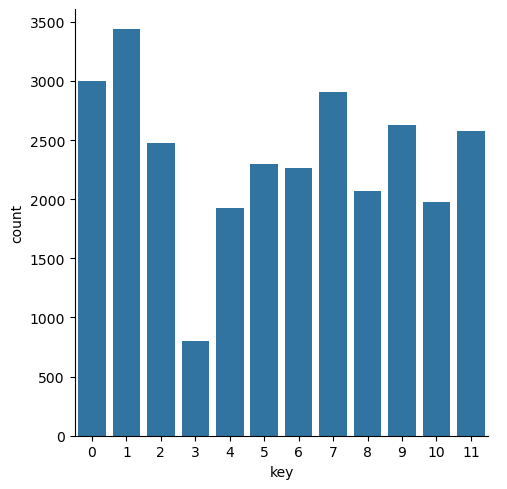

In [20]:
sns.catplot(data = df_copy, x = 'key', kind = 'count')

plt.show()

`key` 3 had significantly less observations than the rest.

`mode`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


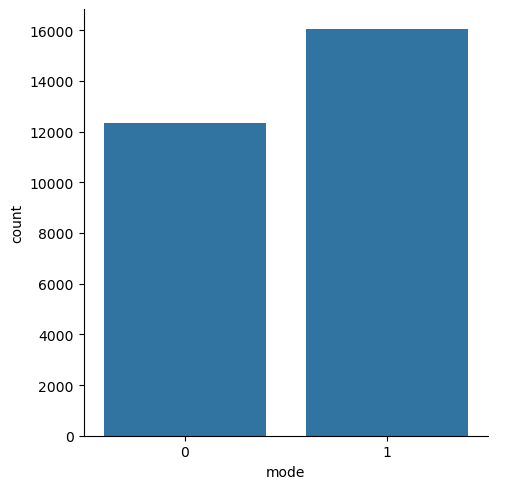

In [21]:
sns.catplot(data = df_copy, x = 'mode', kind = 'count')

plt.show()

`mode` 0 had less observations but still fairly balanced.

`binary_outcome`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


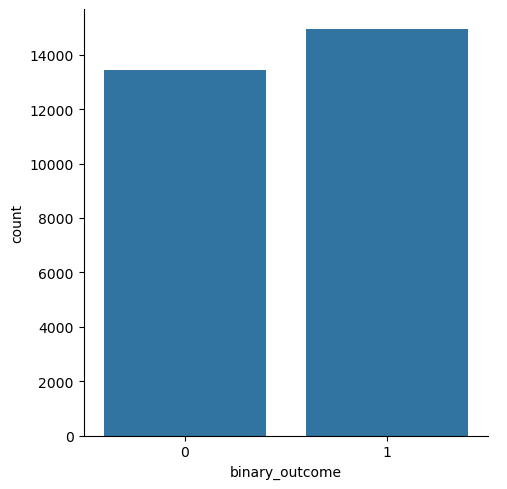

In [22]:
sns.catplot(data = df_copy, x = 'binary_outcome', kind = 'count')

plt.show()

`binary_outcome` has a fair balance.

`release_year`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


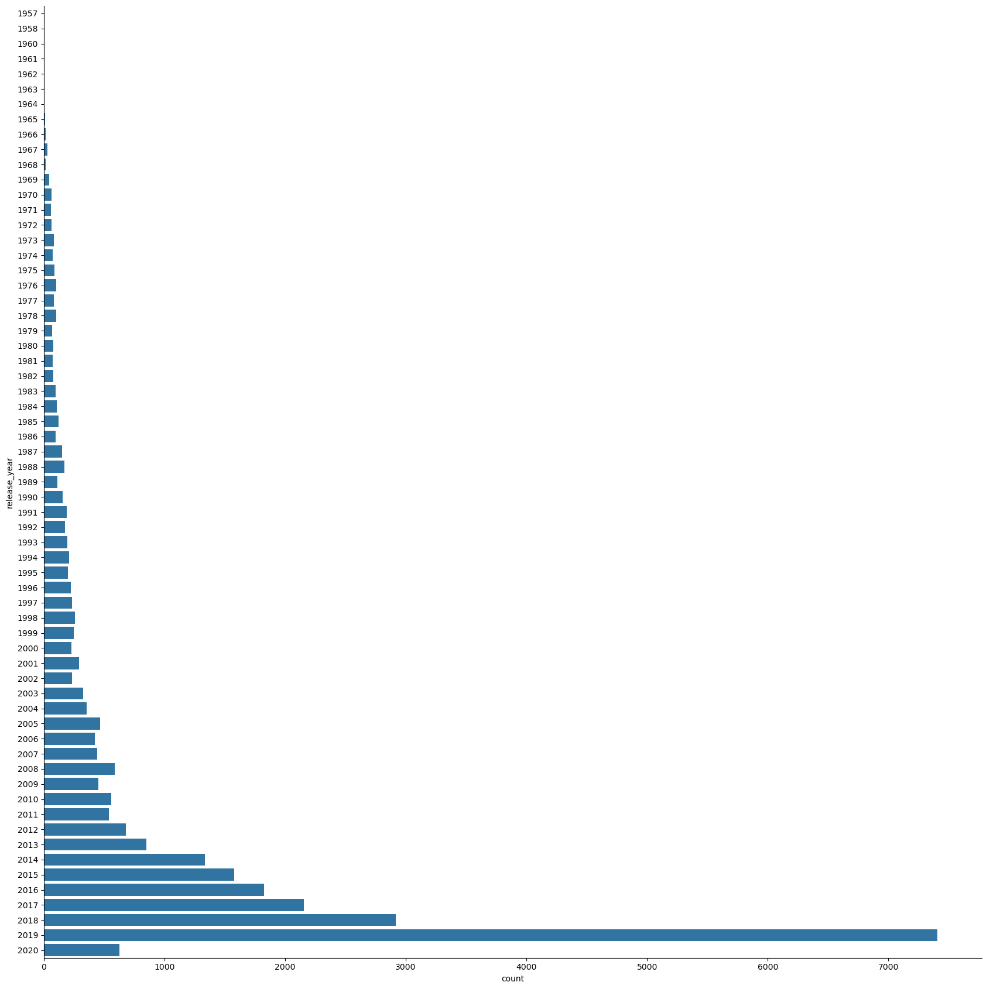

In [23]:
sns.catplot(data=df_copy, y='release_year', kind='count', height=17)

plt.show()

Most song data comes from 2019, but is very tipped towards the more recent past than the older past.

`release_month`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


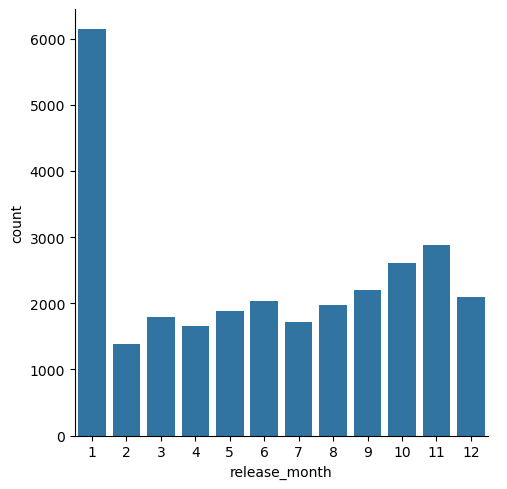

In [24]:
sns.catplot(data=df_copy, x='release_month', kind='count')

plt.show()

The majority of songs were released in January.

Forgot to include earlier, but I will also add a column for `bin_year` per the feedback document's suggestion.

In [25]:
df_copy['bin_year'] = np.where( df_copy.release_year < 2010, 'older', 'recent')

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


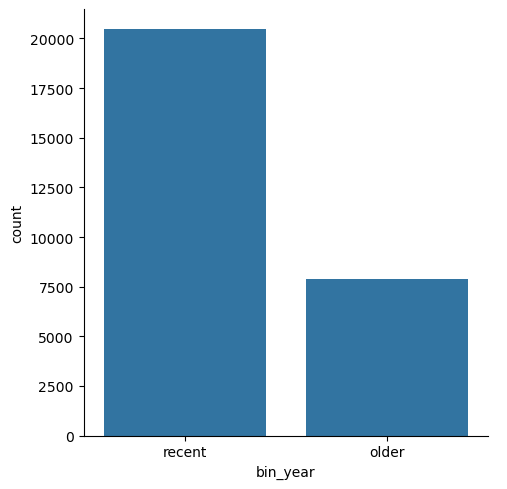

In [26]:
sns.catplot(data=df_copy, x='bin_year', kind='count')

plt.show()

Most songs are still classified as recent, but now easier to examine with 2 categories.

`playlist_genre`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


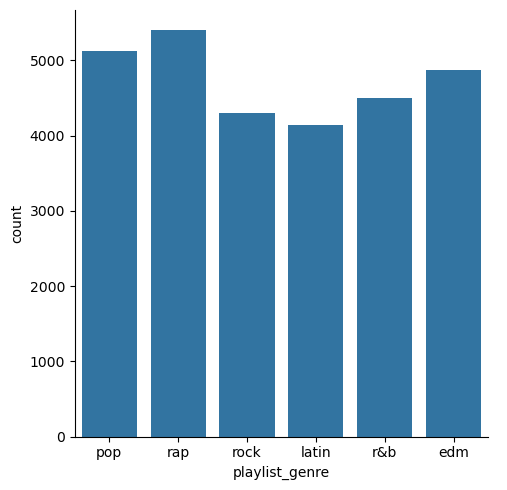

In [27]:
sns.catplot(data=df_copy, x='playlist_genre', kind='count')

plt.show()

Genres are fairly balanced.

2. Distributions of continuous variables

`danceability`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


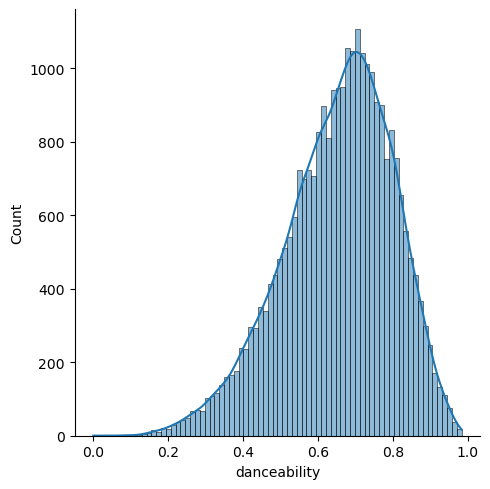

In [28]:
sns.displot(data=df_copy, x='danceability', kde=True)

plt.show()

Most values are around 0.7

`energy`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


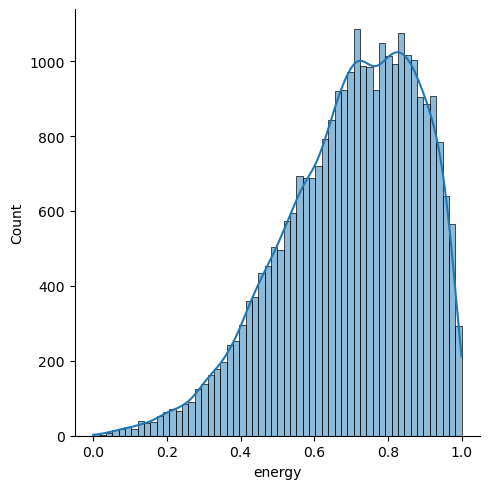

In [29]:
sns.displot(data=df_copy, x='energy', kde=True)

plt.show()

Most values between 0.7 and 0.9.

`speechiness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


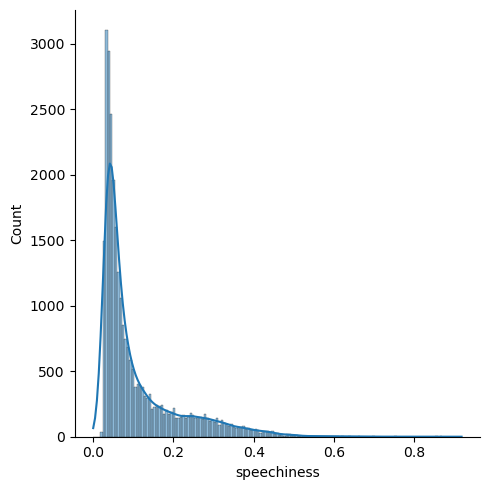

In [30]:
sns.displot(data=df_copy, x='speechiness', kde=True)

plt.show()

Most songs do not have high `speechiness` values which indicates that they are musical tracks - the higher values here probably represent rap/hip-hop songs. 

`loudness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


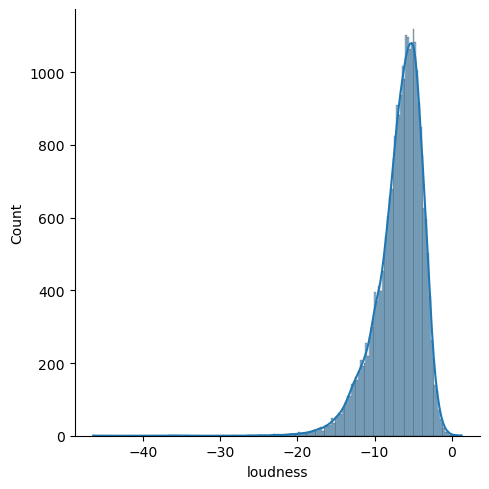

In [31]:
sns.displot(data=df_copy, x='loudness', kde=True)

plt.show()

Most songs have slightly negative loudness values.

`acousticness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


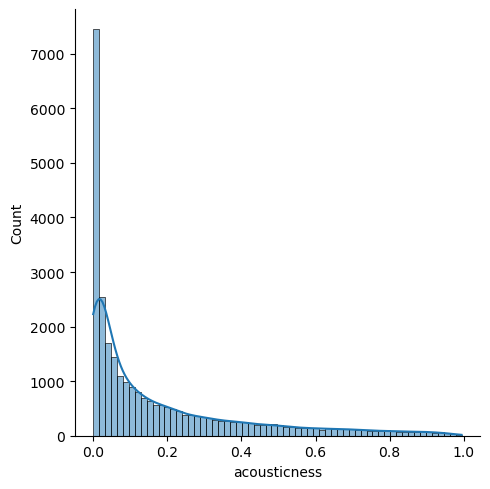

In [32]:
sns.displot(data=df_copy, x='acousticness', kde=True)

plt.show()

Most songs are not confidently acoustic.

`istrumentalness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


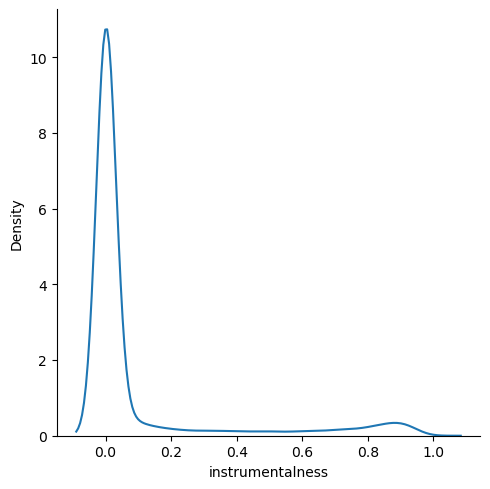

In [33]:
sns.displot(data=df_copy, x='instrumentalness', kind='kde')

plt.show()

The vast majority of songs contain vocals, making the values highly concentrated around 0.

`liveness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


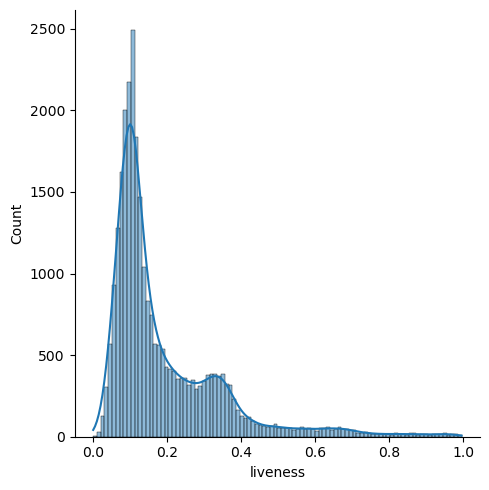

In [34]:
sns.displot(data=df_copy, x='liveness', kde=True)

plt.show()

Nearly all songs are below 0.8, meaning they are not live/no audience can be heard.

`valence`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


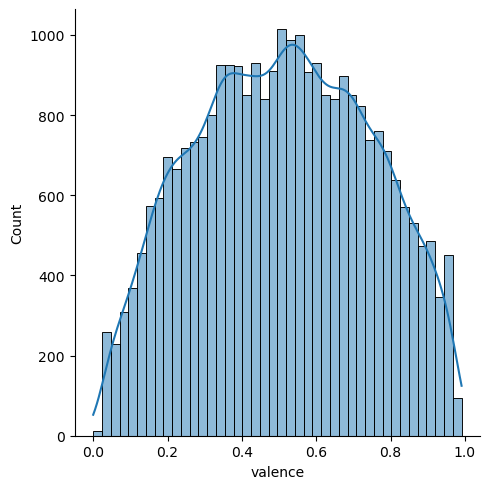

In [35]:
sns.displot(data=df_copy, x='valence', kde=True)

plt.show()

Most songs have a `valence` or happiness factor between 0.3 and 0.8.

`tempo`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


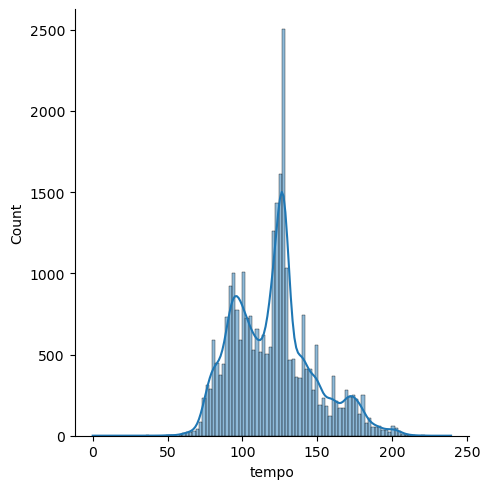

In [36]:
sns.displot(data=df_copy, x='tempo', kde=True)

plt.show()

Tracks have highly concentrated tempos around 100 and 125 bpm.

`duration_ms`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


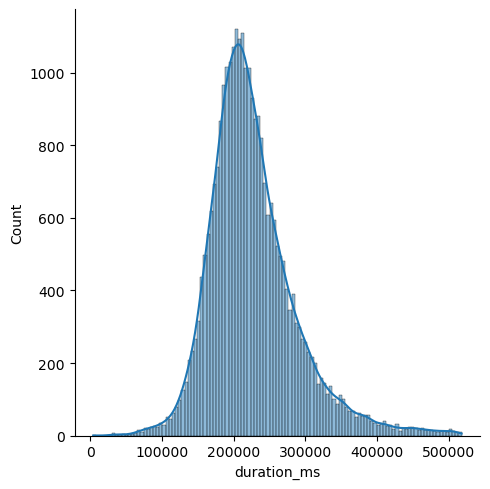

In [37]:
sns.displot(data=df_copy, x='duration_ms', kde=True)

plt.show()

Most songs are around 200000 ms.

3. Relationships between continuous variables

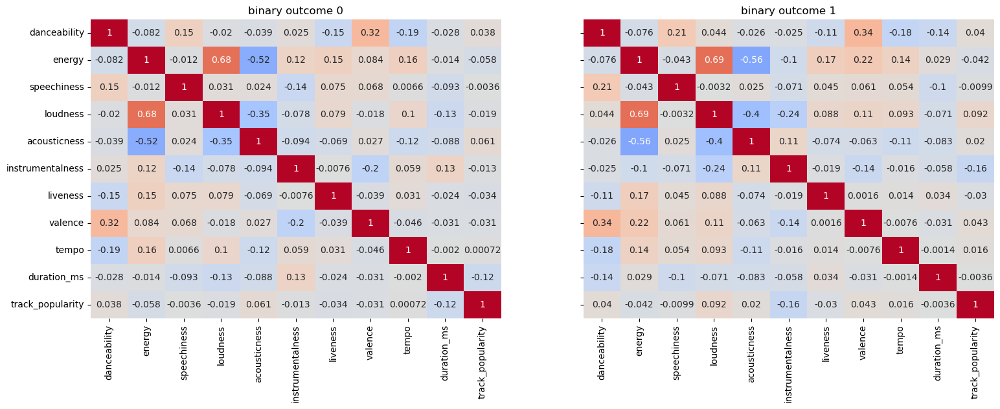

In [38]:
## create a list of the continuous variables
continuous_variable_list = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity']

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

sns.heatmap(data = df_copy.loc[df_copy.binary_outcome == 0, continuous_variable_list].corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', cbar=False,
            annot=True, annot_kws={'size':10},
            ax=axes[0])
axes[0].set_title('binary outcome 0')

sns.heatmap(data = df_copy.loc[df_copy.binary_outcome == 1, continuous_variable_list].corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', cbar=False,
            annot=True, annot_kws={'size':10},
            ax=axes[1])
axes[1].set_title('binary outcome 1')


plt.show()

For both `binary_outcome` values, there is a positive correlation between `loudness` and `energy` and a a negative correlation between `acousticness` and `energy`. There are no strong positive or negative correlations between `track_popularity` and any continuous variable.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


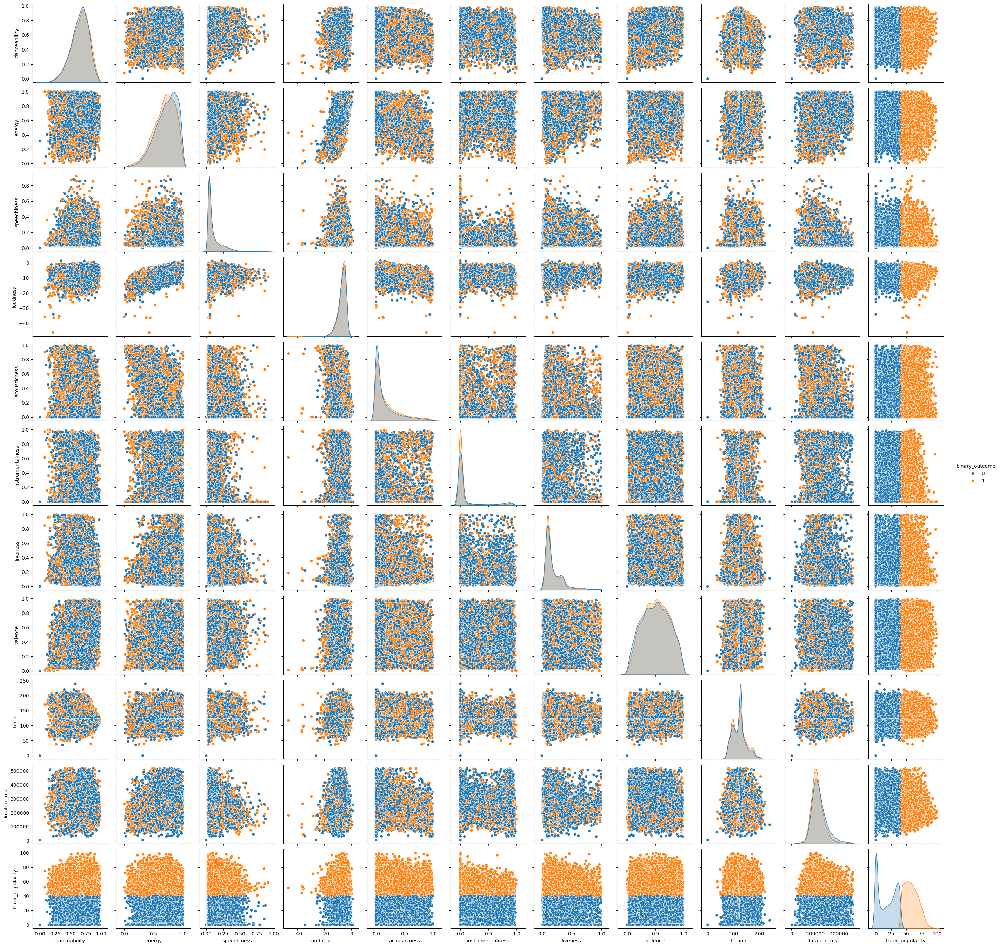

In [39]:
sns.pairplot(data = df_copy, x_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'],
             y_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'],
             diag_kws={'common_norm': False},
            hue='binary_outcome')

plt.show()

As shown by the correlation plot, there are no distinguishable relationships between continuous variables.

4. Summaries of the continuous variables grouped by categorical variables

Modify the data into long-format to begin

In [40]:
df_copy_long = df_copy.reset_index().rename(columns={'index':'row_id'}).\
melt(id_vars = ['row_id', 'playlist_genre', 'key', 'mode', 'release_year', 'release_month', 'binary_outcome', 'bin_year'],
     value_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'])

Continuous variables grouped by `playlist_genre`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


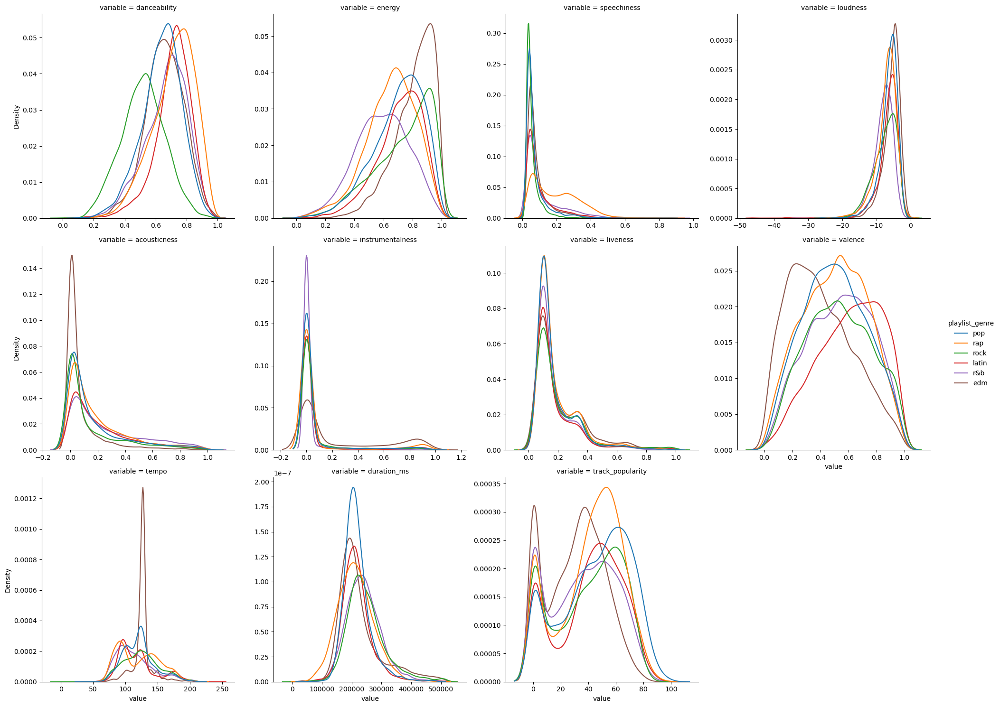

In [41]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='playlist_genre',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


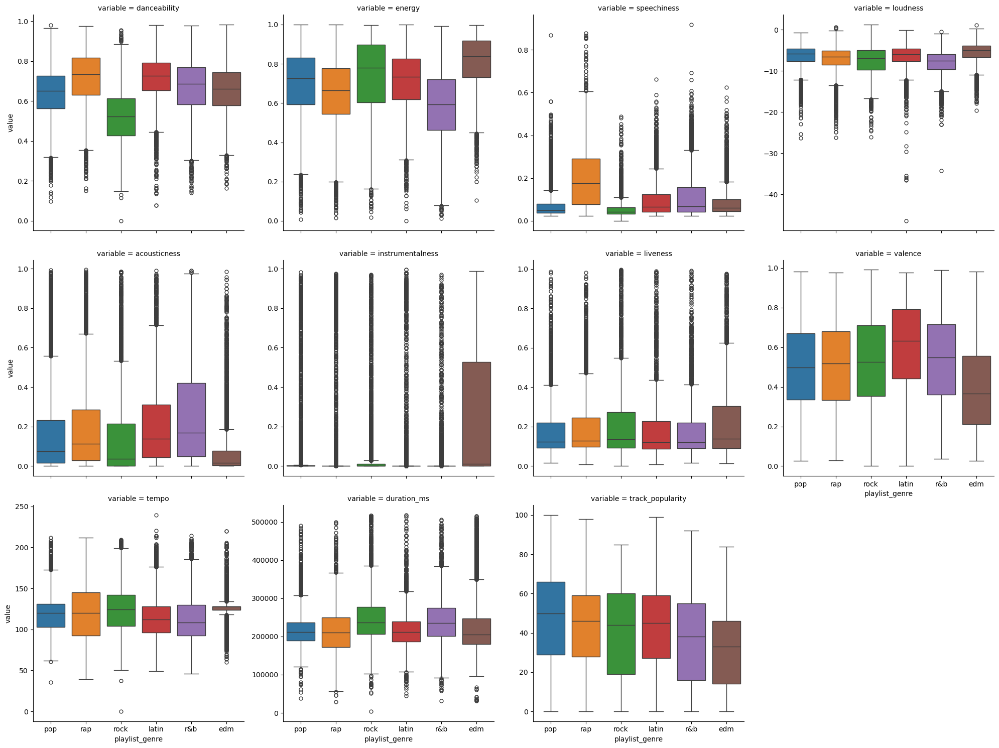

In [42]:
sns.catplot(data=df_copy_long, x='playlist_genre', y='value', col='variable',
           kind='box', hue='playlist_genre', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


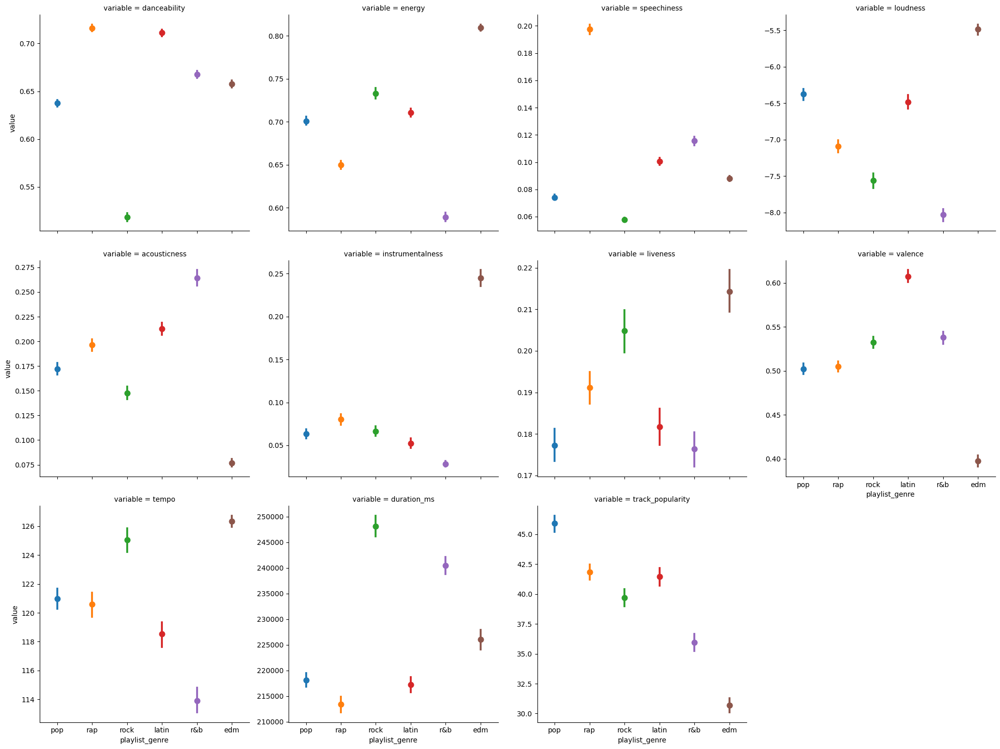

In [43]:
sns.catplot(data=df_copy_long, x='playlist_genre', y='value', col='variable',
           kind='point', hue='playlist_genre', sharey=False,
           col_wrap=4)

plt.show()

The different genres are noticeably different across the continuous variables - including `track_popularity`. Interested to see if this becomes a statistically significant variable in modeling.

Continuous variables grouped by `key`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


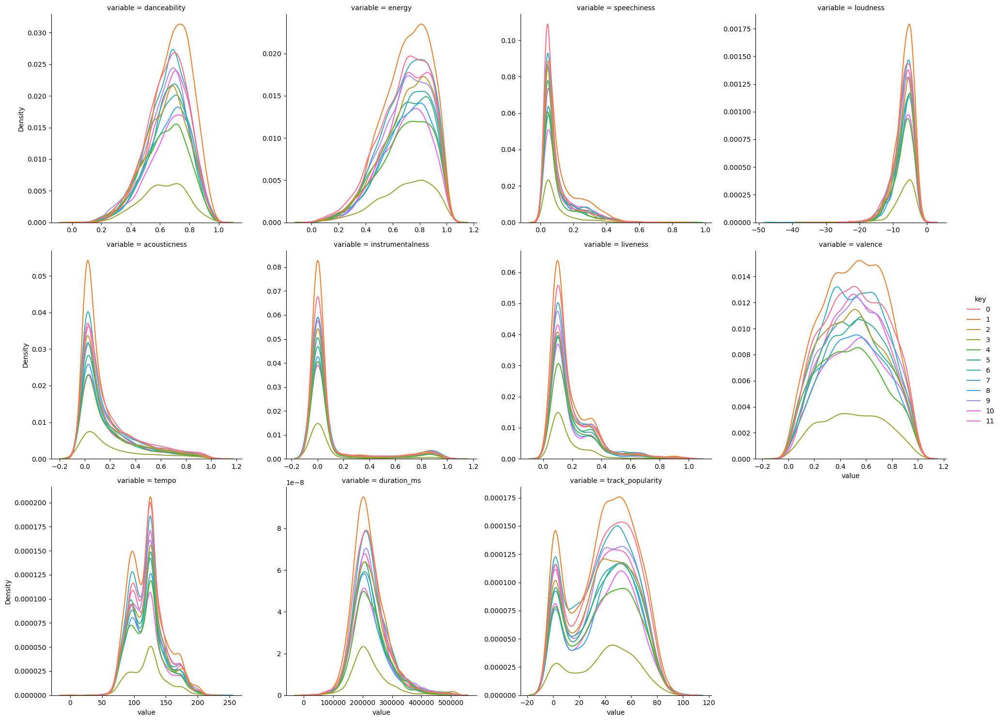

In [44]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='key',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


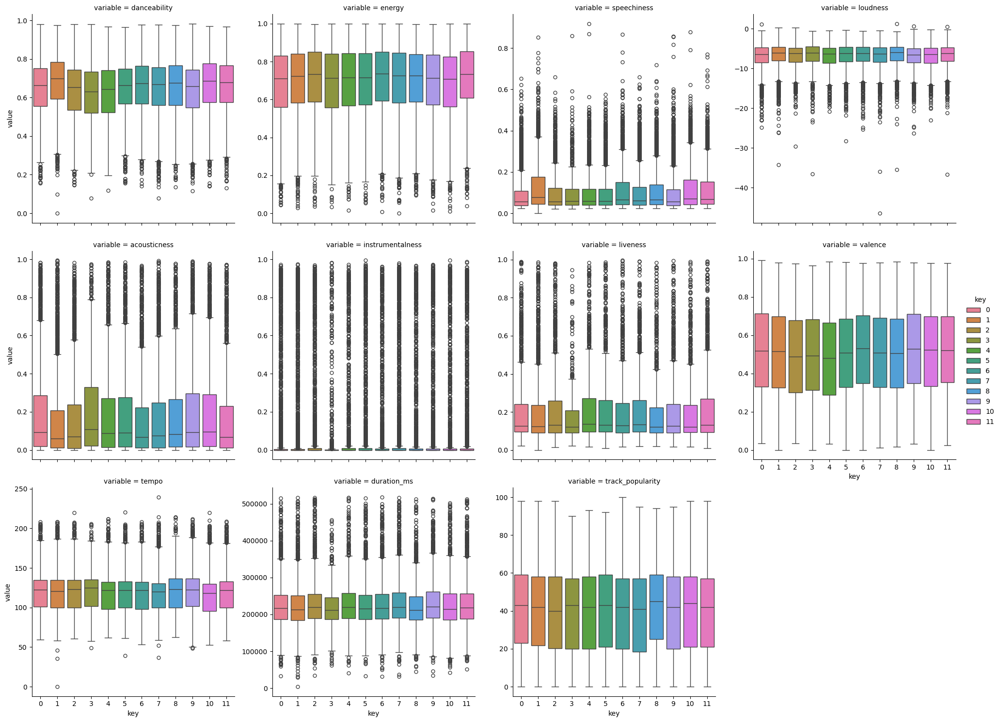

In [45]:
sns.catplot(data=df_copy_long, x='key', y='value', col='variable',
           kind='box', hue='key', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


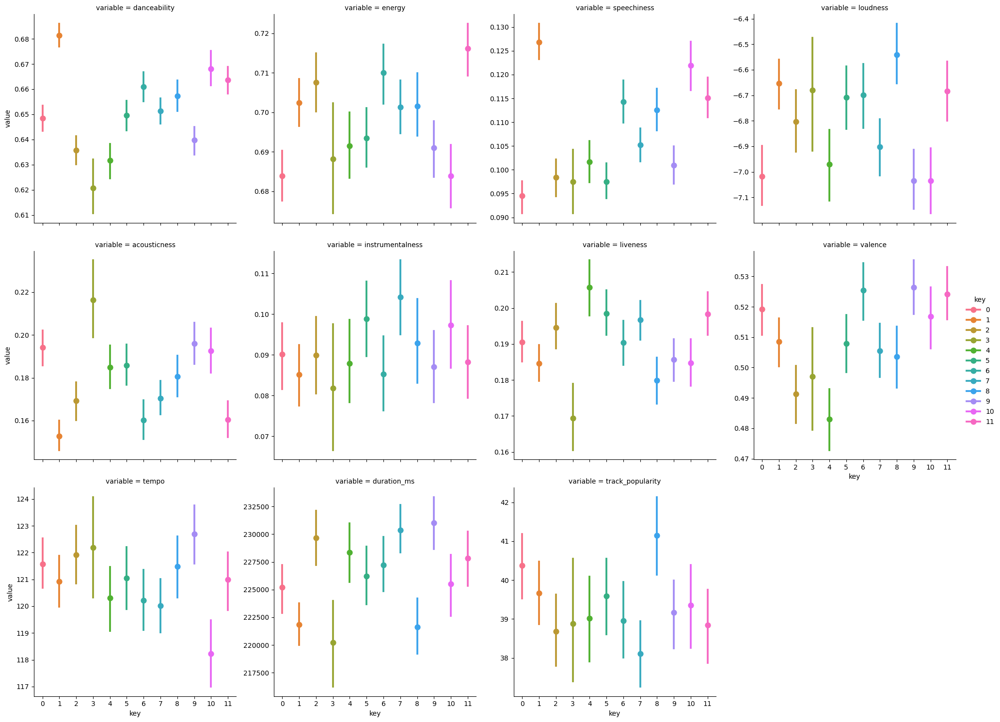

In [46]:
sns.catplot(data=df_copy_long, x='key', y='value', col='variable',
           kind='point', hue='key', sharey=False,
           col_wrap=4)

plt.show()

When grouped by `key`, there are differences between continuous variables. It looks like `key` 8 is almost statistically more popular than the others.

Continuous variables grouped by `mode`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


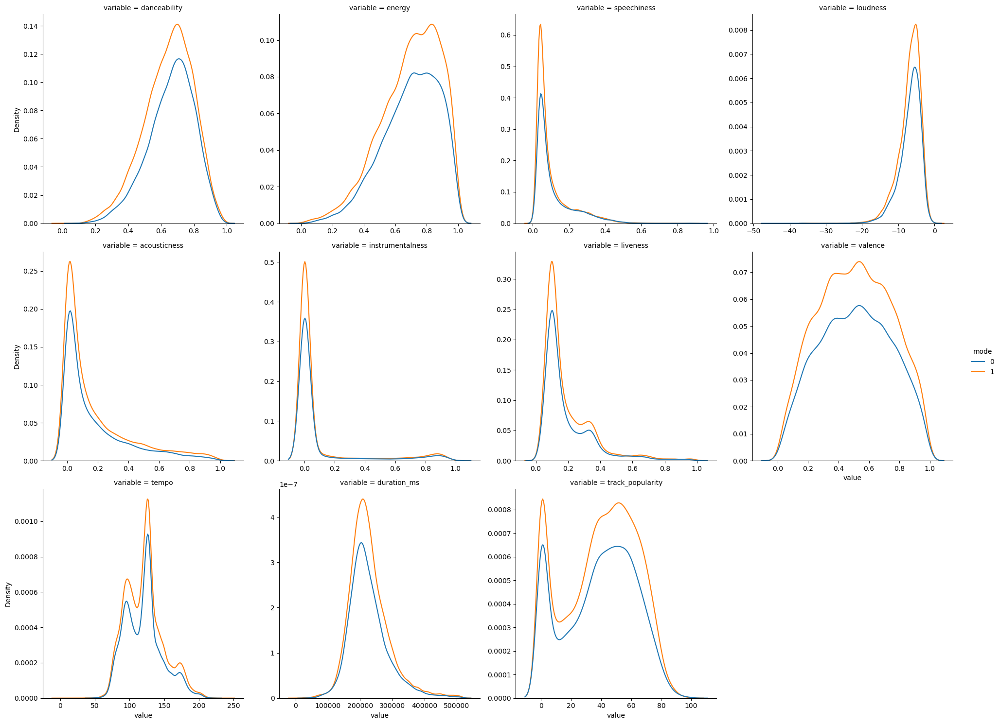

In [47]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='mode',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


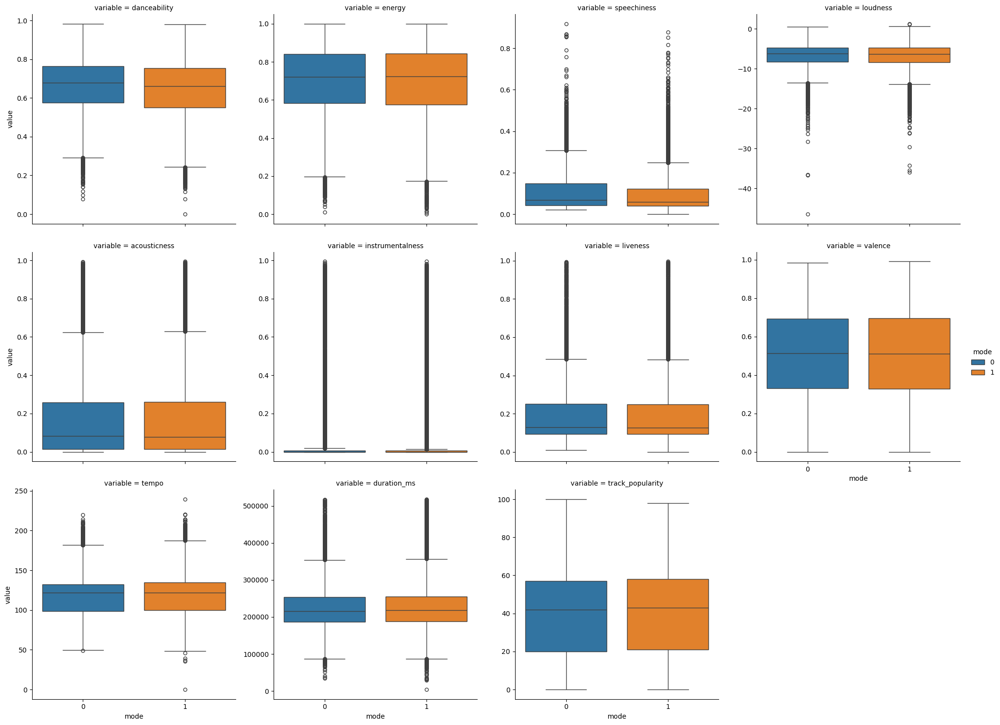

In [48]:
sns.catplot(data=df_copy_long, x='mode', y='value', col='variable',
           kind='box', hue='mode', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


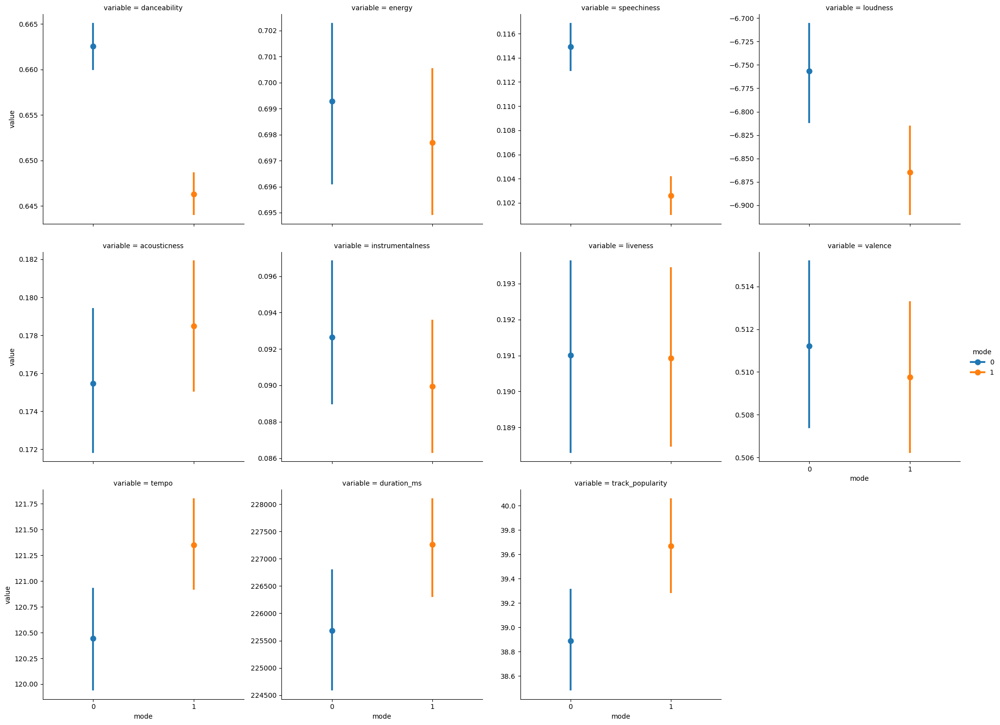

In [49]:
sns.catplot(data=df_copy_long, x='mode', y='value', col='variable',
           kind='point', hue='mode', sharey=False,
           col_wrap=4)

plt.show()

`mode` does not seem to have influence on other continuous variables.

Continuous variables grouped by `release_month`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


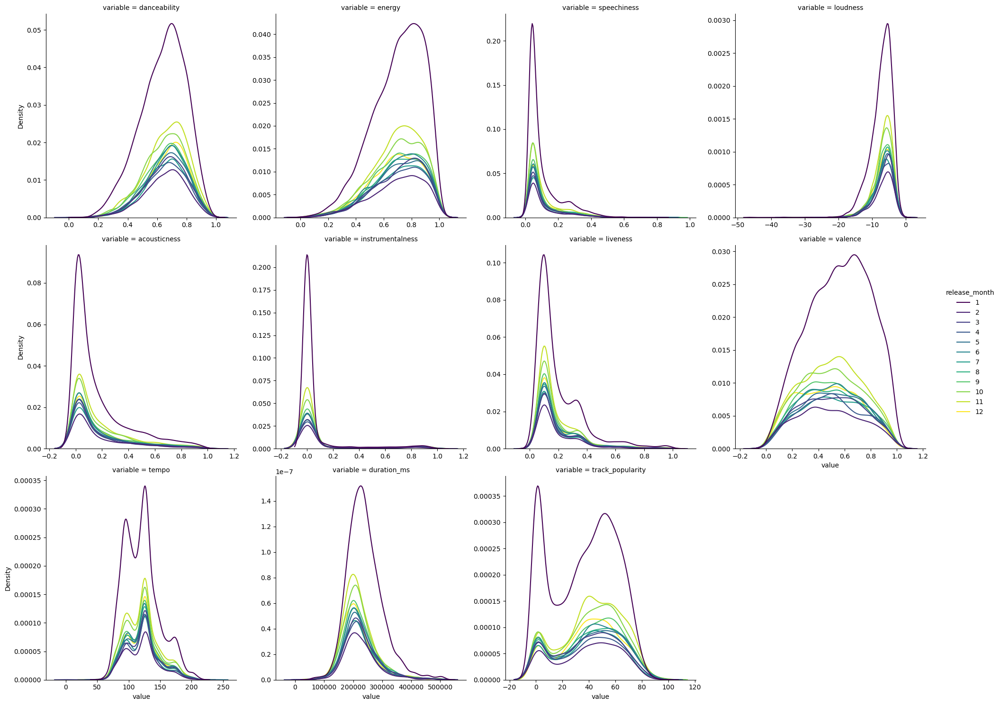

In [50]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='release_month',
           col_wrap=4,
           palette='viridis')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


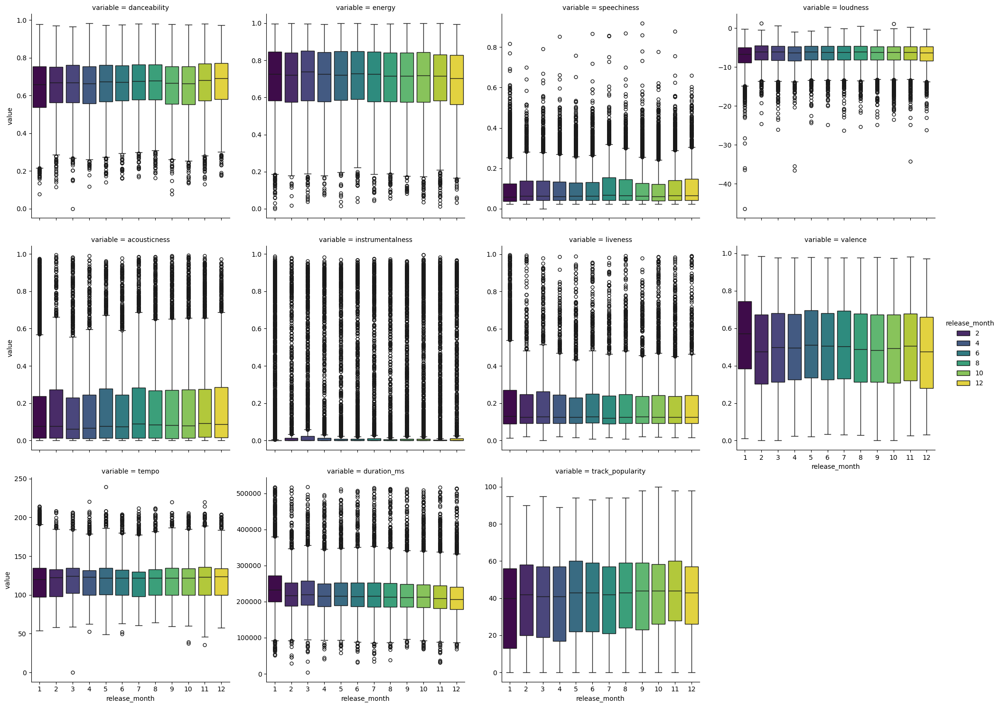

In [51]:
sns.catplot(data=df_copy_long, x='release_month', y='value', col='variable',
           kind='box', hue='release_month', sharey=False,
           col_wrap=4,
           palette='viridis')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


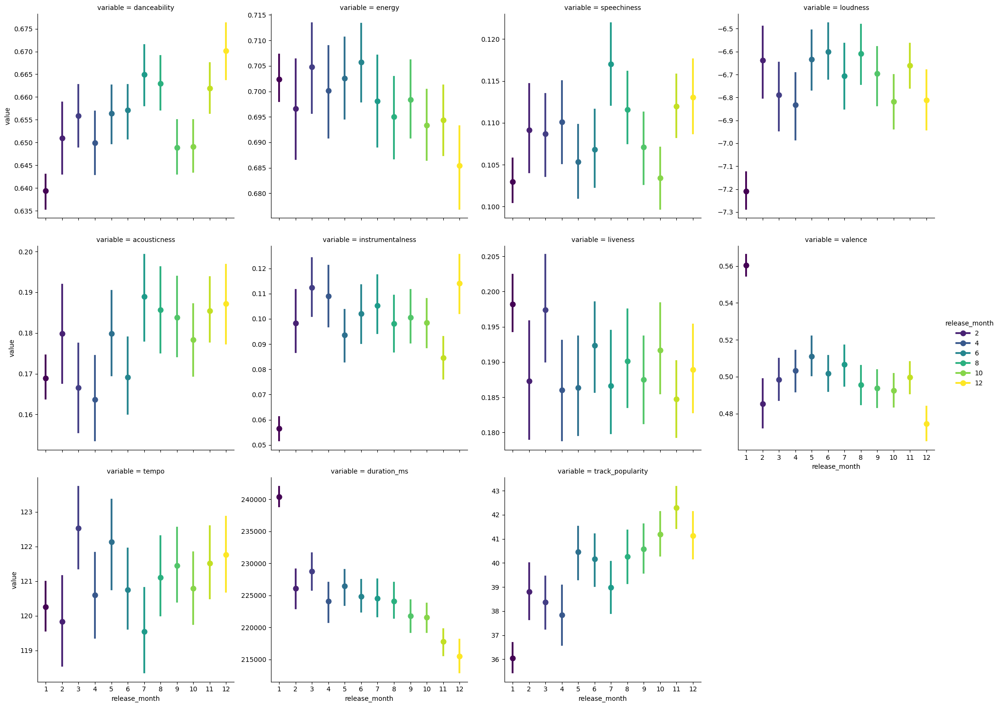

In [52]:
sns.catplot(data=df_copy_long, x='release_month', y='value', col='variable',
           kind='point', hue='release_month', sharey=False,
           col_wrap=4,
           palette='viridis')

plt.show()

Looks like songs in January are different on average from other months but less popular.

Continuous variables grouped by `binary_outcome`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


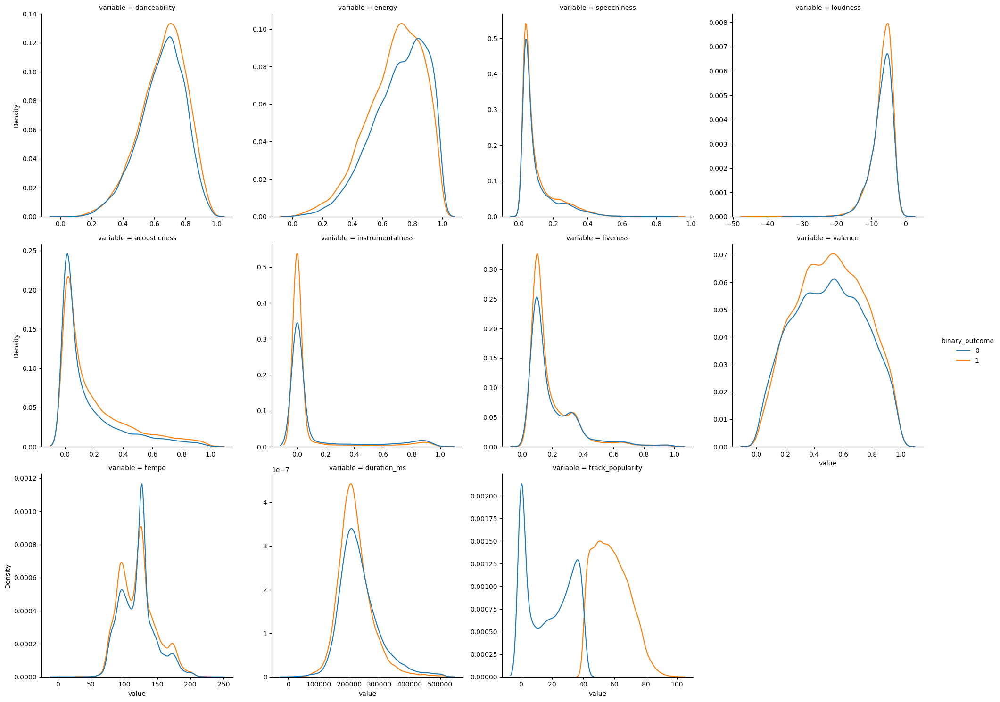

In [53]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='binary_outcome',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


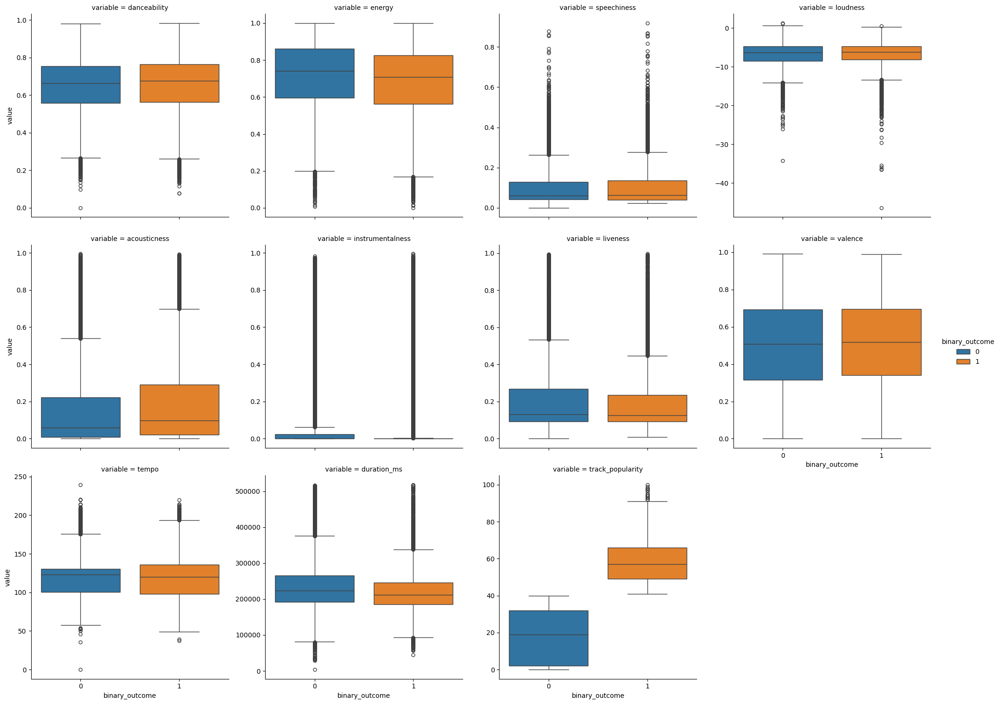

In [54]:
sns.catplot(data=df_copy_long, x='binary_outcome', y='value', col='variable',
           kind='box', hue='binary_outcome', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


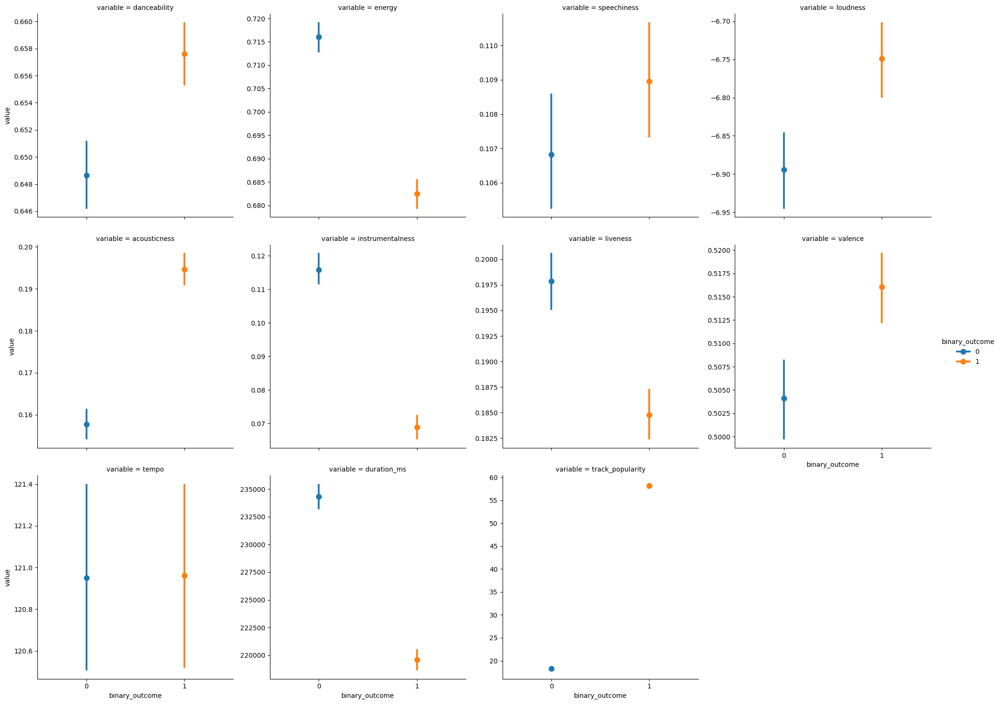

In [55]:
sns.catplot(data=df_copy_long, x='binary_outcome', y='value', col='variable',
           kind='point', hue='binary_outcome', sharey=False,
           col_wrap=4)

plt.show()

Based on `binary_outcome` - we can see clear differences on average of most continuous variables.

Continuous variables grouped by `bin_year`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


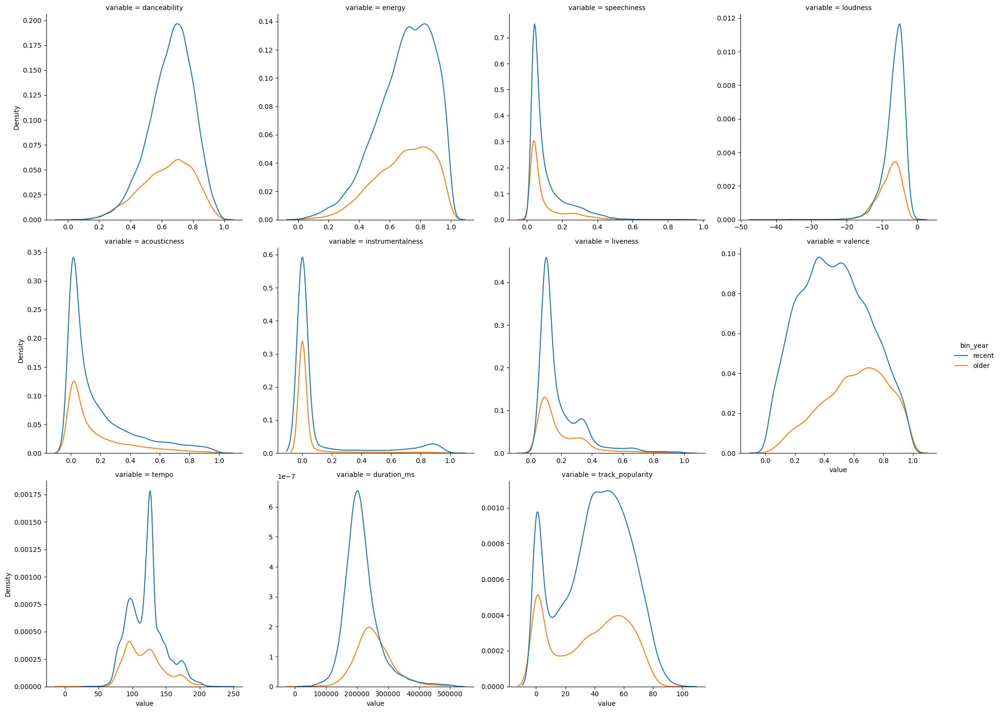

In [56]:
sns.displot(data=df_copy_long, x='value', col='variable', kind='kde',
           facet_kws = {'sharex':False, 'sharey':False},
           hue='bin_year',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


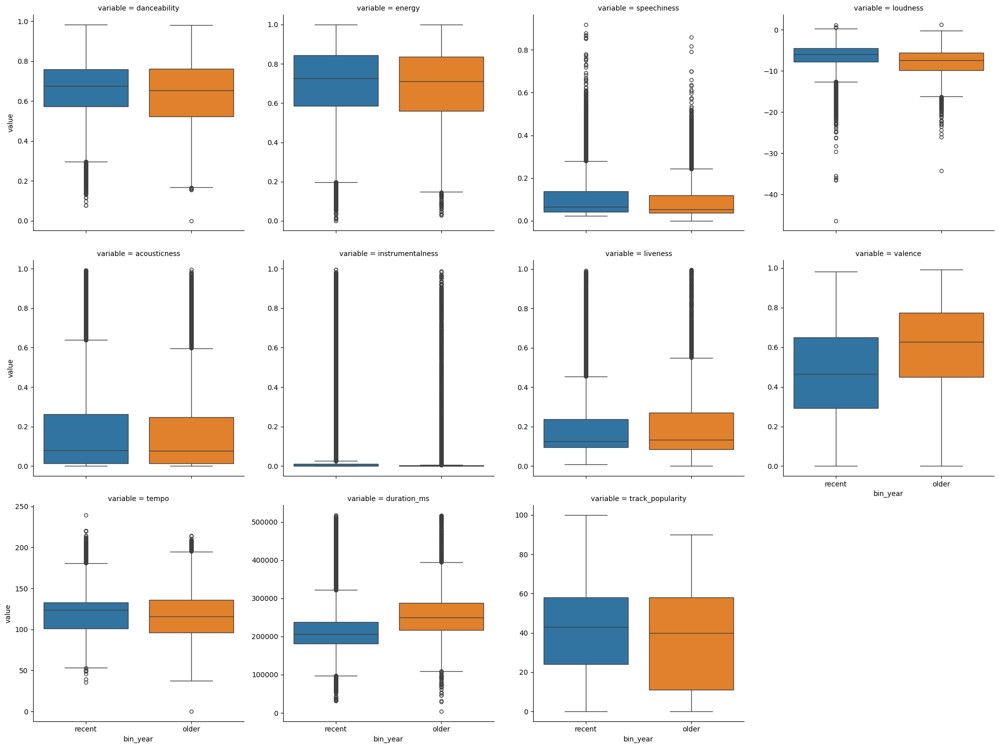

In [57]:
sns.catplot(data=df_copy_long, x='bin_year', y='value', col='variable',
           kind='box', hue='bin_year', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


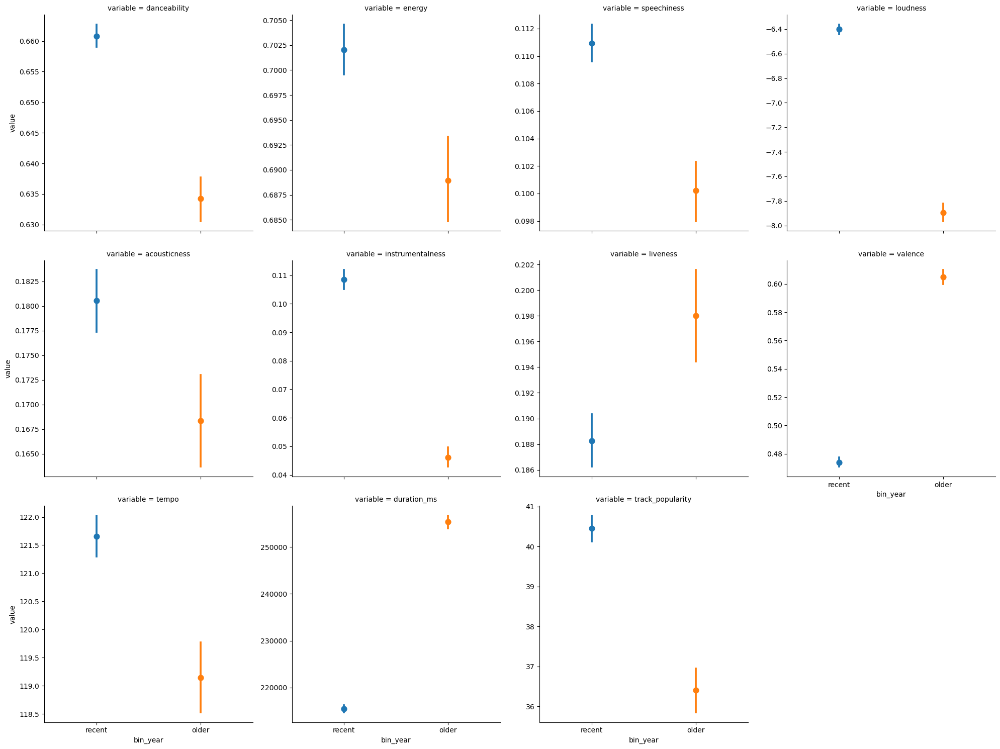

In [58]:
sns.catplot(data=df_copy_long, x='bin_year', y='value', col='variable',
           kind='point', hue='bin_year', sharey=False,
           col_wrap=4)

plt.show()

On average, there are clear differences across continuous variables when looking at `bin_year`

6. **If you are working on a classification problem:**

a. Visualize histograms and relationships between continuous inputs broken up by the outcome unique values. 
* Histograms of each continuous variable faceted by the categorical output values are below.
* The relationships between the continuous inputs per unique output value are above in the corrplot and pairs plot.

`danceability`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


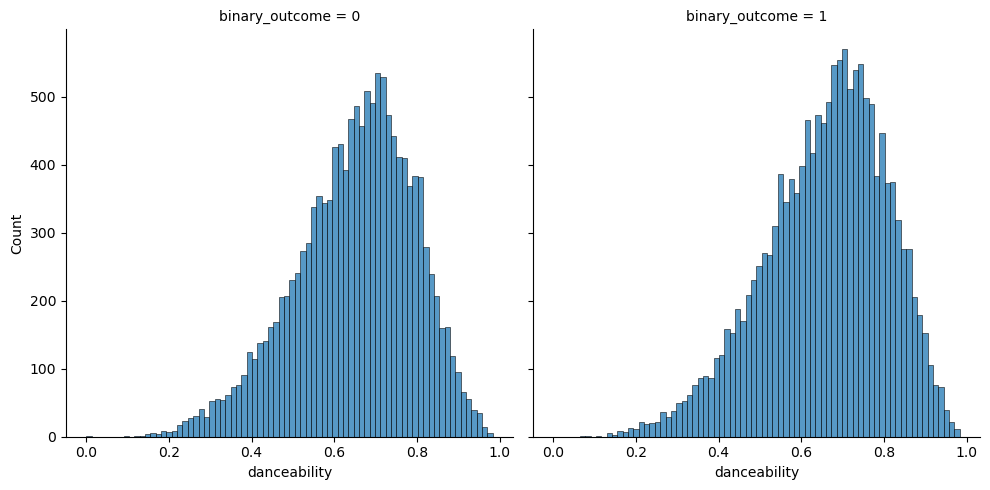

In [59]:
sns.displot(data=df_copy, x='danceability', kind='hist', col='binary_outcome')

plt.show()

`energy`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


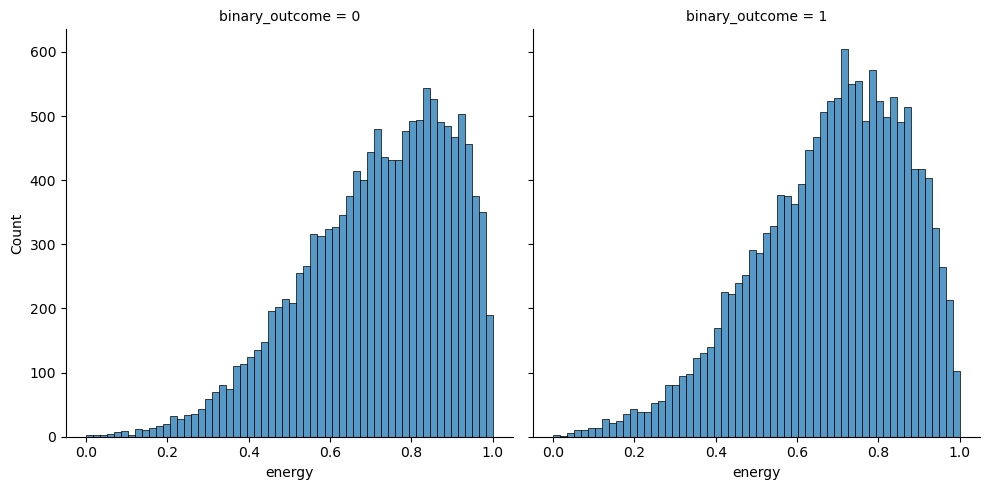

In [60]:
sns.displot(data=df_copy, x='energy', kind='hist', col='binary_outcome')

plt.show()

`loudness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


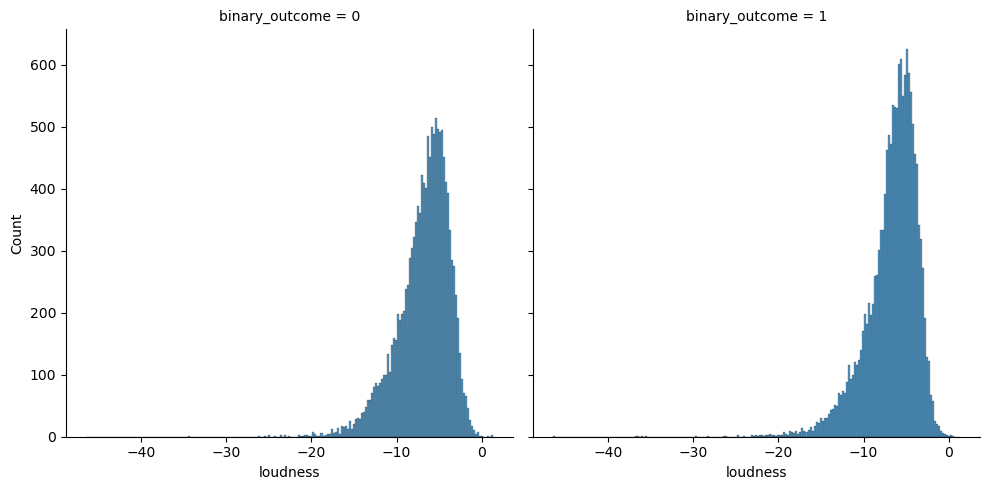

In [61]:
sns.displot(data=df_copy, x='loudness', kind='hist', col='binary_outcome')

plt.show()

`speechiness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


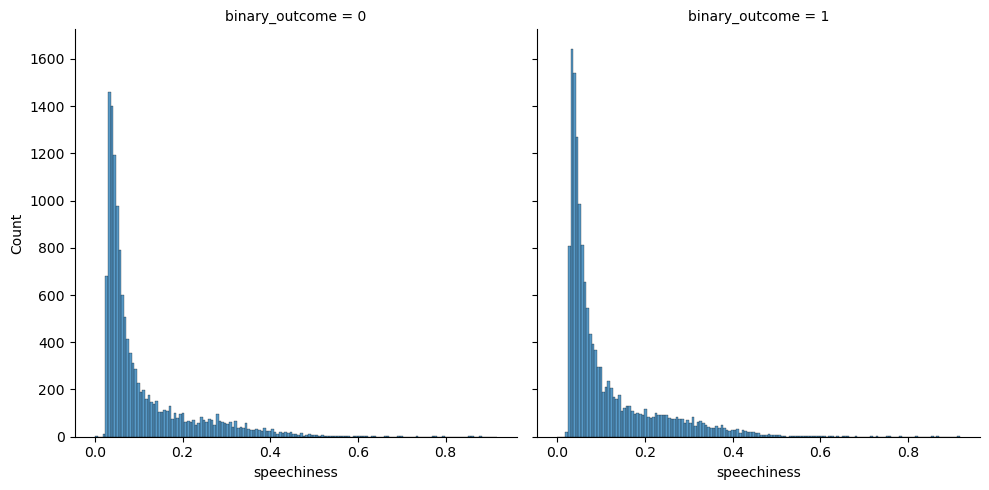

In [62]:
sns.displot(data=df_copy, x='speechiness', kind='hist', col='binary_outcome')

plt.show()

`acousticness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


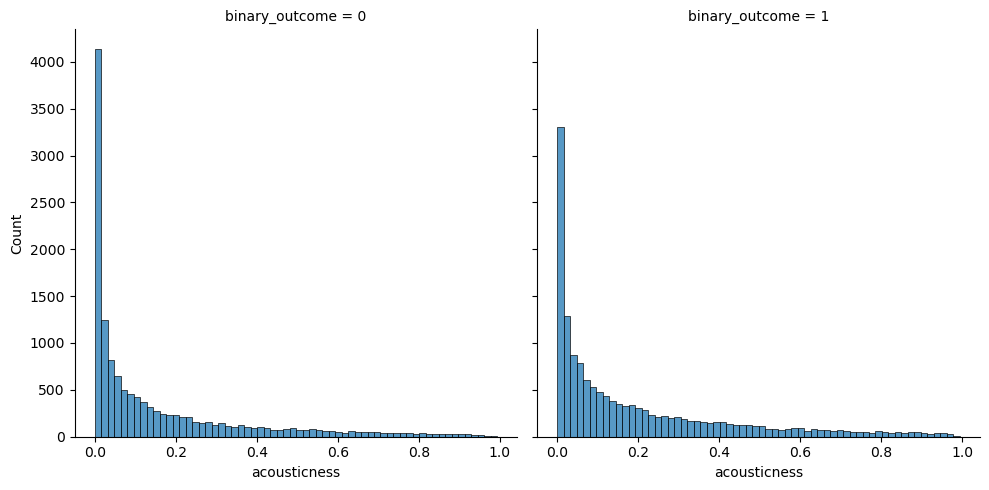

In [63]:
sns.displot(data=df_copy, x='acousticness', kind='hist', col='binary_outcome')

plt.show()

`instrumentalness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


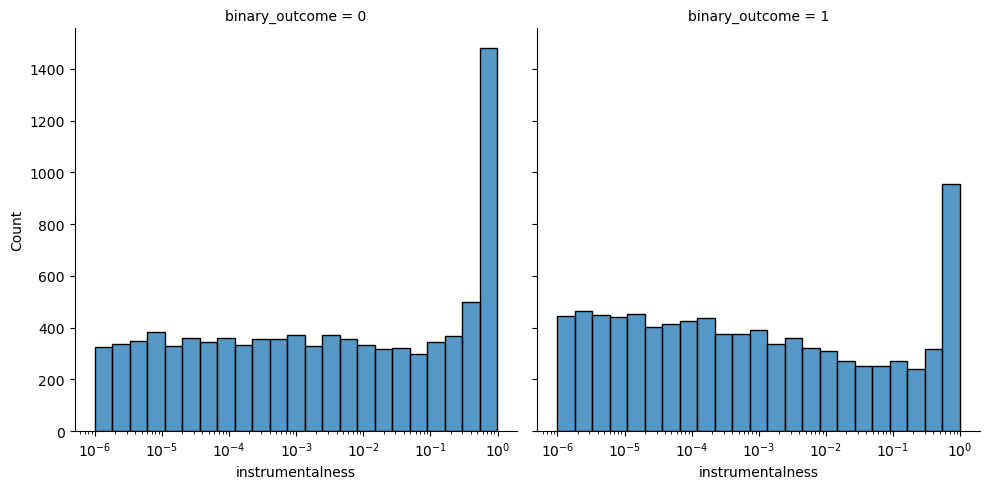

In [64]:
sns.displot(data=df_copy, x='instrumentalness', kind='hist', col='binary_outcome', log_scale=(True, False))

plt.show()

The `log_scale()` argument came from the linked webpage to better visualize `instrumentalness` in a histogram.

https://stackoverflow.com/questions/773814/plot-logarithmic-axes

`liveness`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


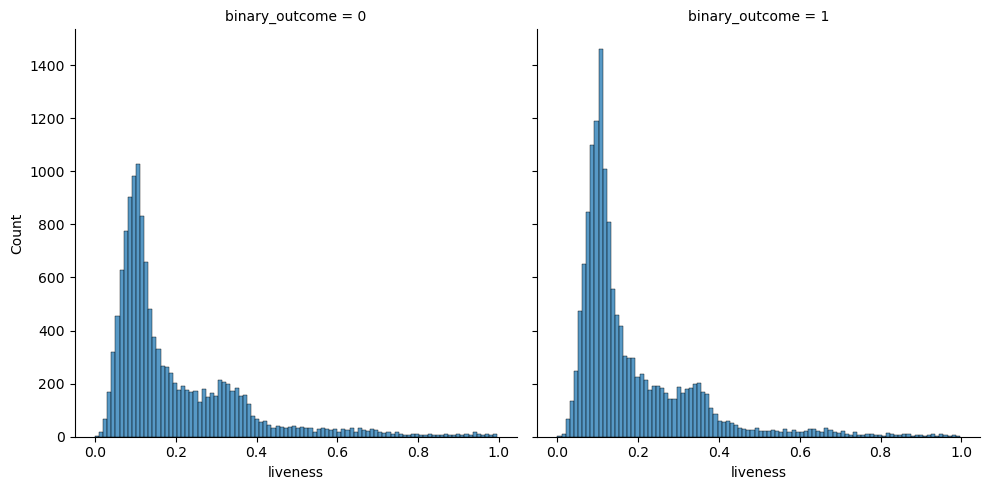

In [65]:
sns.displot(data=df_copy, x='liveness', kind='hist', col='binary_outcome')

plt.show()

`valence`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


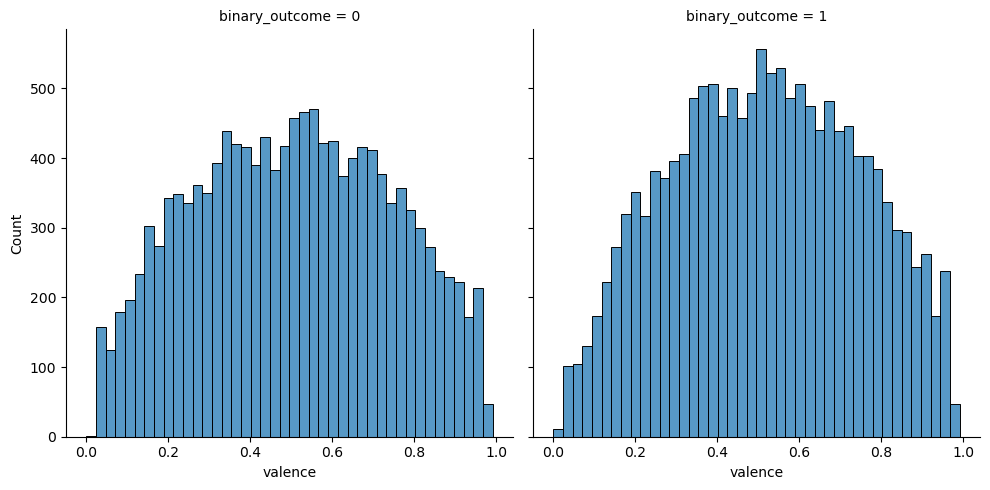

In [66]:
sns.displot(data=df_copy, x='valence', kind='hist', col='binary_outcome')

plt.show()

`tempo`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


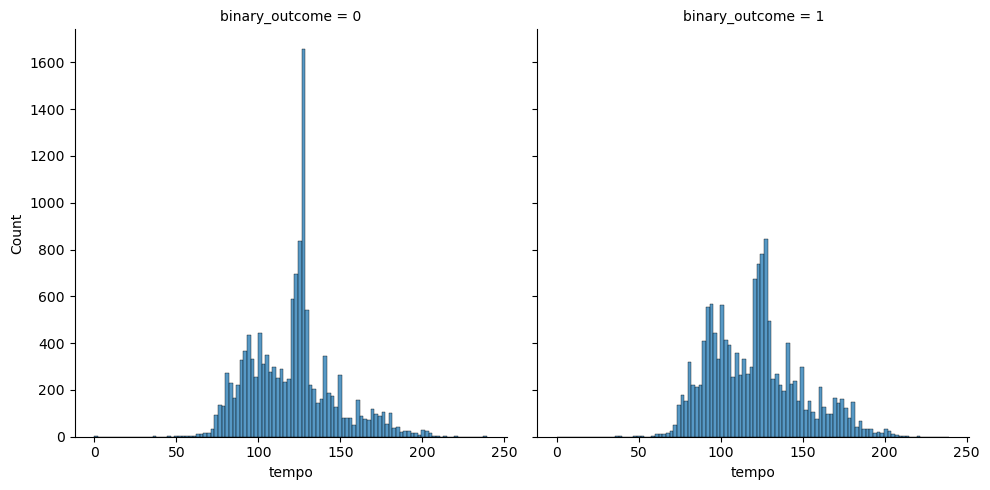

In [67]:
sns.displot(data=df_copy, x='tempo', kind='hist', col='binary_outcome')

plt.show()

`duration_ms`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


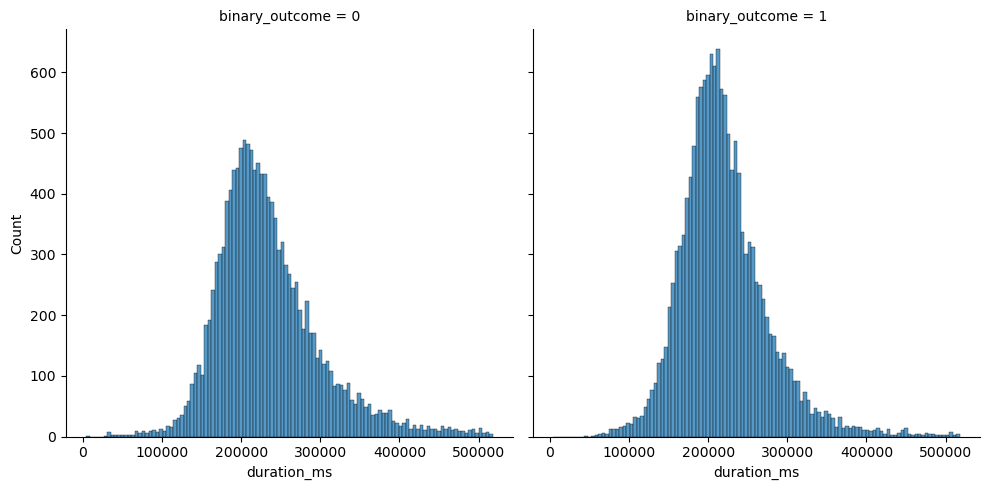

In [68]:
sns.displot(data=df_copy, x='duration_ms', kind='hist', col='binary_outcome')

plt.show()

The distributions for the continuous variables did not seem to change when faceted by `binary_outcome`

b. Count the number of observations for each combination of outcome unique value and the categorical input unique values.

`playlist_genre`

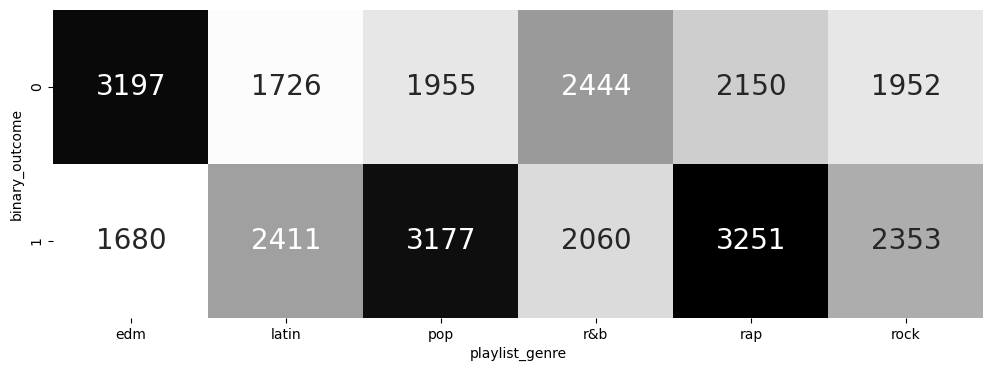

In [69]:
fig, ax = plt.subplots(figsize=(12,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.playlist_genre),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

`key`

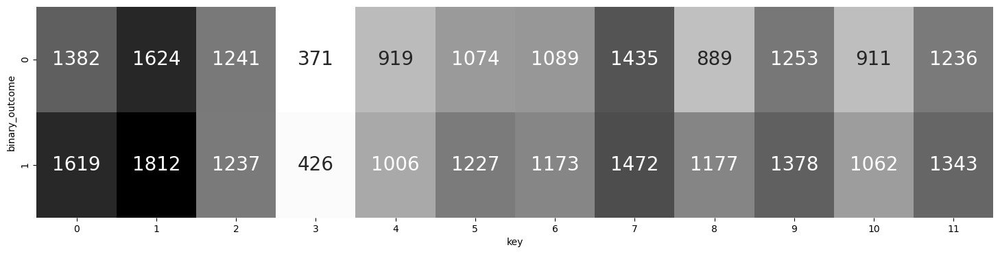

In [70]:
fig, ax = plt.subplots(figsize=(18,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.key),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

`mode`

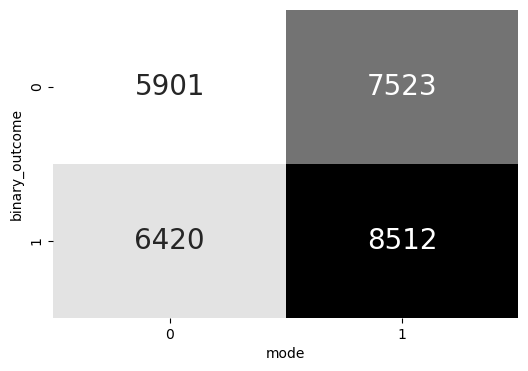

In [71]:
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy['mode']),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

`release_month`

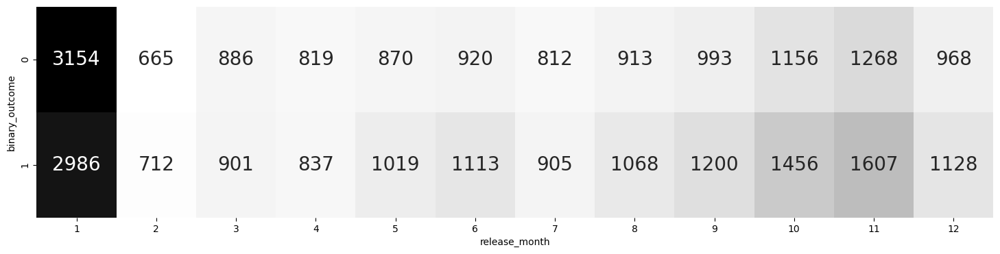

In [72]:
fig, ax = plt.subplots(figsize=(18,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.release_month),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

`bin_year`

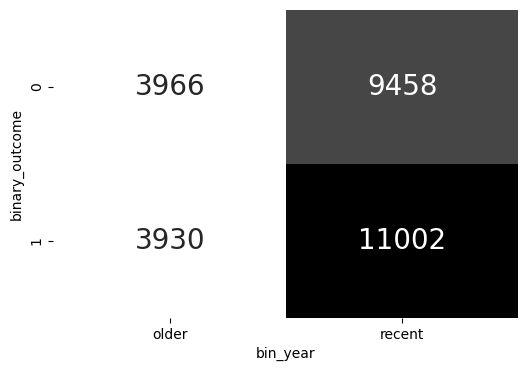

In [73]:
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.bin_year),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

c. Use ROC curves or precision-recall curves to assess the performance of classification models, alongside confusion matrices.

* Will return to this section in the modeling notebook

### Reporting
* In the main report you must include what you feel are the most important figures to describe the behavior in your data.
  * The pairs and corr plots show little to no correlation with any of the continuous variables and `track_popularity`
  * The `bin_year` heat map shows that there is a lot more recent songs versus older songs, but that they are fairly evenly distributed between `binary_outcome` 0 and 1.
  * The point plot of the long data faceted by `binary_outcome` shows significant differences in the averages for `danceability`, `energy`, `loudness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, and `duration_ms`.
* Avoid overcrowding your main report with unnecessary figures. Each figure should serve a clear purpose in supporting your analysis. Essentially, describe the important conclusions that should be drawn from that figure. The description does not have to be long. You should provide enough to detail to make it obvious you understand what the figure is showing. Thus, your main report does not need a full EDA—You already performed a full EDA with the proposal.
  * Notes included throughout
* Failure to draw inferences from the figures included in your main report may result in a penalty. Ensure that your discussion clearly reflects an understanding of what the figure indicates and its significance to your analysis.
  * Notes included throughout
* The supporting document for EDA can include many more figures. In this way, your support document can be your practice notebook where you try out different groupings and visualizations. You do not need to include discussion text in your support document. If you feel your proposal included all the figures you tried out, you may submit your proposal again as the supporting document. The supporting document allows you the opportunity to show you explored other options after receiving the proposal feedback. For example, you should visualize distributions of transformed variables as recommended in the proposal feedback.
### Considerations
* Based on the proposal feedback, explore the different methods available to handle MISSING data and ensure that you visualize the impact of each method.  Ensure that your EDA and reporting are thorough, and remember that inferences drawn from your visualizations are essential to demonstrate your analytical skills.
  * No feedback from the proposal, continued with the same methods

### Book Keeping

I'll save the cleaned data set, `df_copy`, to a csv for use in other notebooks.

In [74]:
df_copy.to_csv('spotify_cleaned_data.csv', index=False)